# Take a dataset, do an n-fold creation of training and testing data, use an ensemble to combine them again

In [1]:
from gumps.graph.regressor import RegressorPlotParameters, RegressorPlot
import pandas as pd
import numpy as np
from gumps.studies.batch_study import AbstractBatchStudy
from typing import Callable

from gumps.solvers.sampler import SamplerSolverParameters
from gumps.apps.parametric_sweep import ParametricSweepApp

import sklearn.model_selection
import matplotlib.pyplot as plt

from gumps.solvers.regressors.polynomial_regressor import PolynomialRegressionParameters, PolynomialRegressor
from gumps.solvers.regressors.ensemble_regressor import EnsembleRegressor, EnsembleParameters
from gumps.solvers.mutual_info import MutualSettings, MutualInfoRegression

/home/wheymann/mambaforge/envs/gumps_311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Create a basic dataset

In [2]:
class SyntheticBatchStudy(AbstractBatchStudy):
    "batch version of sphere study (designed to approximate surrogate model)"

    def __init__(self, *, model_variables:dict):
        self.model_variables = model_variables

    def start(self):
        "initialize this study"

    def stop(self):
        "handle shutdown tasks"

    def run(self, input_data:pd.DataFrame, processing_function:Callable|None=None) -> pd.DataFrame:
        "run the batch simulation"
        output_data = pd.DataFrame()
        output_data["w"] = input_data['a'] + input_data['b']
        output_data["x"] = input_data['c']**2 + input_data['d']
        output_data["y"] = input_data['a']**2 + input_data['b']
        output_data["z"] = input_data['a'] + input_data['b'] + input_data['c'] + input_data['d']

        self.save_results(input_data, output_data)

        if processing_function is None:
            return output_data
        else:
            return processing_function(output_data)

In [3]:
def get_all(frame:pd.DataFrame) -> pd.DataFrame:
    "processing function to get the total from the dataframe"
    return frame * np.random.normal(1, 0.2, size=frame.shape)

In [4]:
batch = SyntheticBatchStudy(model_variables={})

parameters = SamplerSolverParameters(
    number_of_samples = 1000,
    lower_bound = {'a':-1, 'b':-1, 'c':-1, 'd':-1},
    upper_bound = {'a':1, 'b':1, 'c':1, 'd':1},
    sampler = "sobol"
    )

app = ParametricSweepApp(parameters=parameters,
        processing_function=get_all,
        directory=None,
        batch=batch)
app.run()

/home/wheymann/mambaforge/envs/gumps_311/lib/python3.11/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


<Axes: >

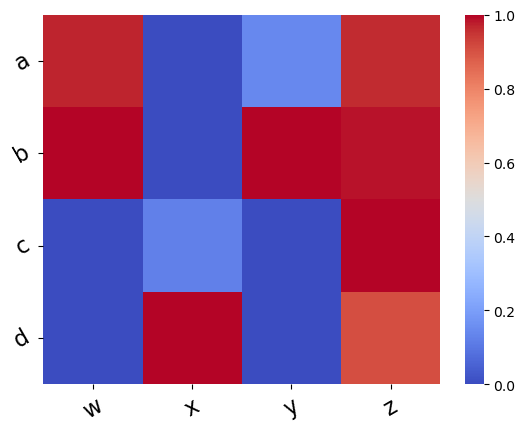

In [5]:
mutual_settings = MutualSettings(app.factors, app.responses, n_neighbors=20)
mutual = MutualInfoRegression(mutual_settings)
mutual.fit()

mutual.plot_scaled()

## Build a polynomial regressor that we can put into the ensemble

In [6]:
reg_data = PolynomialRegressionParameters(input_data = app.factors,
                                          output_data = app.responses,
                                          order = 2
                                          )

regressor_inner = PolynomialRegressor(reg_data)

# Build an ensemble regressor

In [7]:
ensemble_parameters = EnsembleParameters(input_data=app.factors,
                                         output_data=app.responses,
                                        regressor = regressor_inner,
                                        number_regressors = 10,
                                        validation_fraction = 0.25,
                                        weight_ensemble=False)

ensemble = EnsembleRegressor(ensemble_parameters)
ensemble.fit()

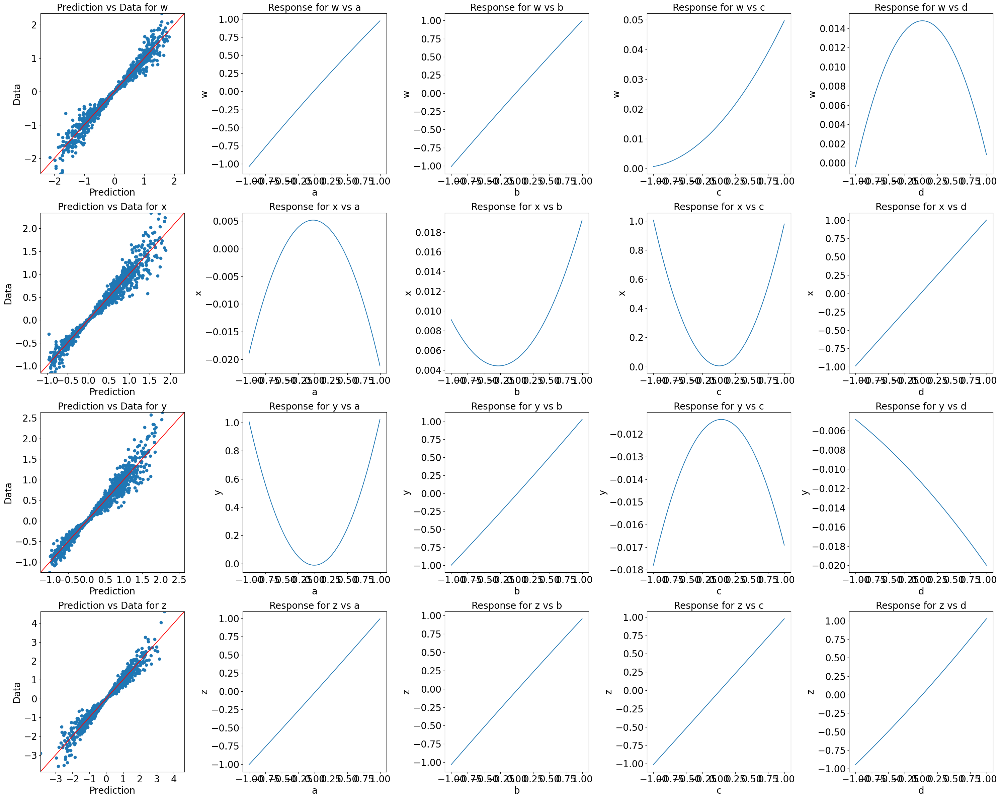

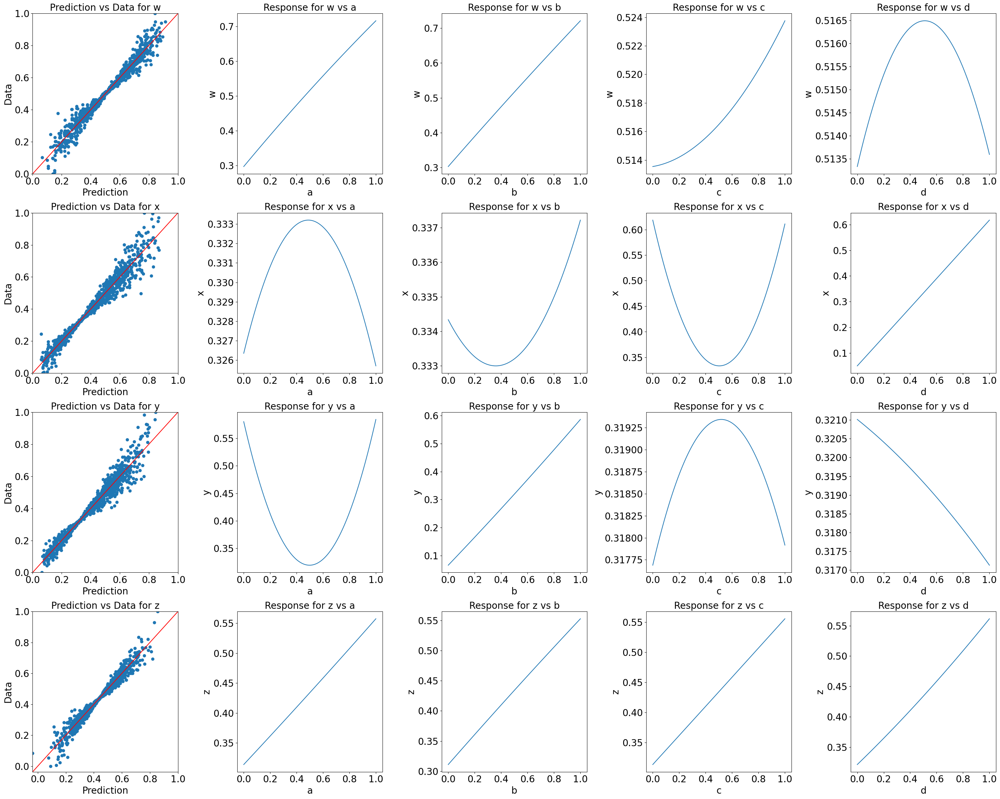

In [8]:
params_full = RegressorPlotParameters(ensemble, app.factors.mean(), app.factors.min(), app.factors.max())
reg_plot_full = RegressorPlot(params_full)
reg_plot_full.plot()
reg_plot_full.plot_scaled()

In [9]:
ensemble.weights

,w,x,y,z
0,0.1,0.1,0.1,0.1
1,0.1,0.1,0.1,0.1
2,0.1,0.1,0.1,0.1
3,0.1,0.1,0.1,0.1
4,0.1,0.1,0.1,0.1
5,0.1,0.1,0.1,0.1
6,0.1,0.1,0.1,0.1
7,0.1,0.1,0.1,0.1
8,0.1,0.1,0.1,0.1
9,0.1,0.1,0.1,0.1


In [10]:
for idx, regressor in enumerate(ensemble.regressors):
    print(f'Regressor {idx} nrmse: {regressor.error_metrics()["nrmse"]}')

Regressor 0 nrmse: 0.03636415836870275
Regressor 1 nrmse: 0.036368013477288484
Regressor 2 nrmse: 0.03638389423177968
Regressor 3 nrmse: 0.03641878845009309
Regressor 4 nrmse: 0.036344123020178115
Regressor 5 nrmse: 0.03636893809946657
Regressor 6 nrmse: 0.03636183430965497
Regressor 7 nrmse: 0.03638812338237028
Regressor 8 nrmse: 0.03637192471985313
Regressor 9 nrmse: 0.036319957341824916


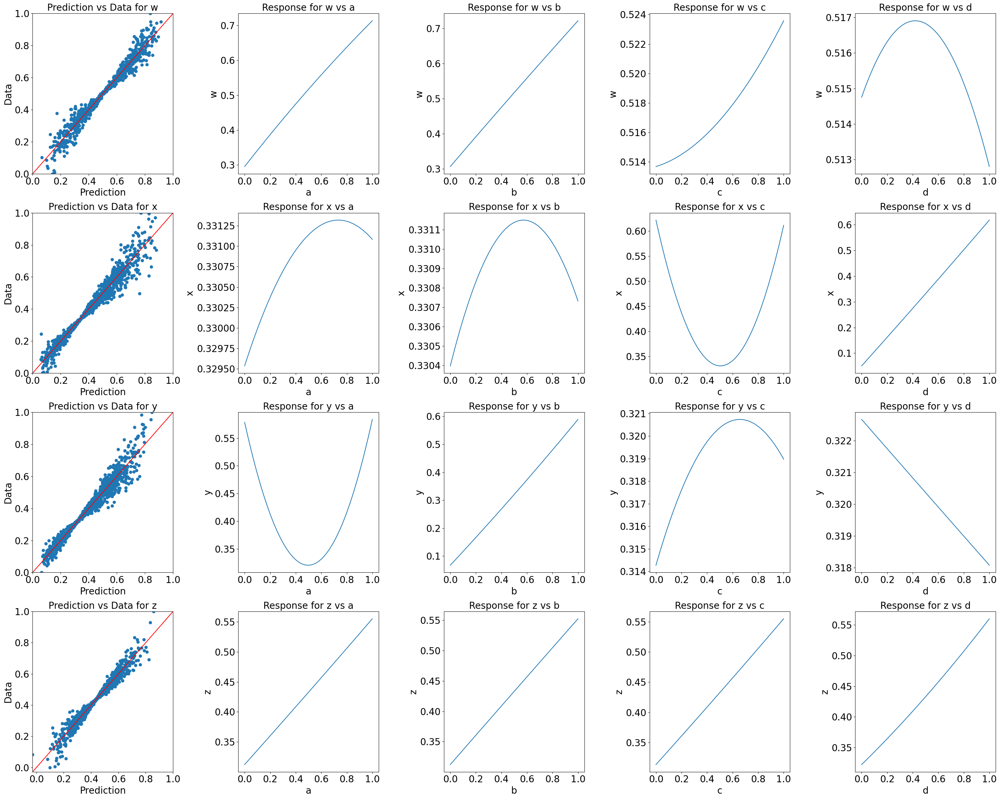

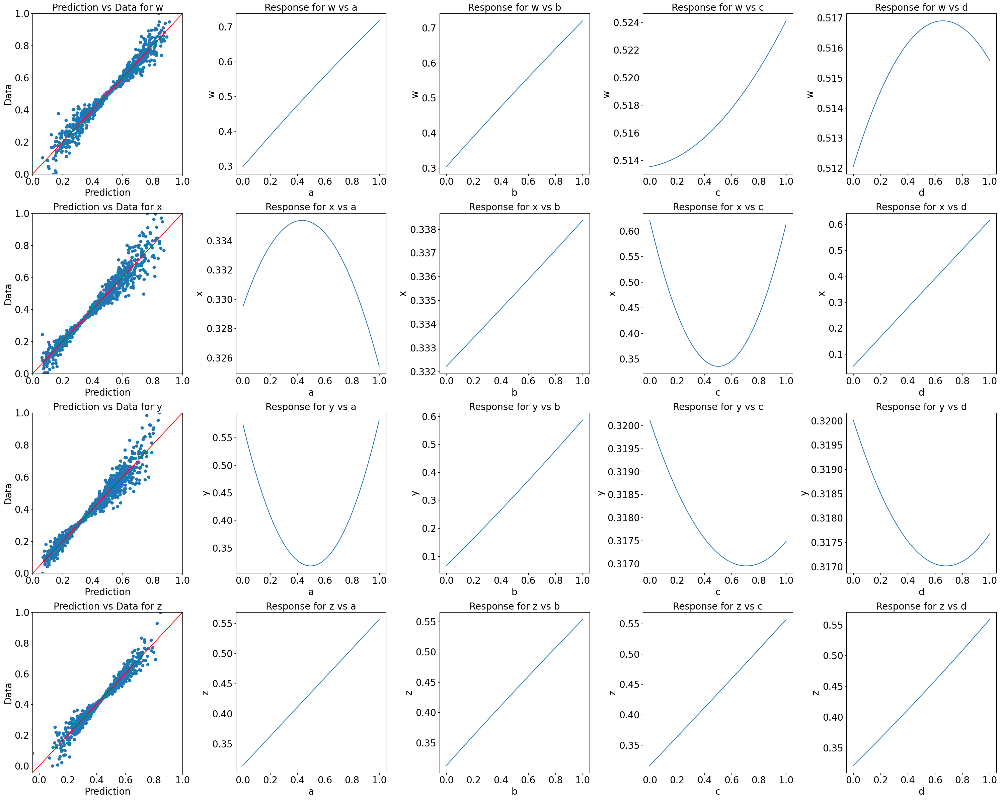

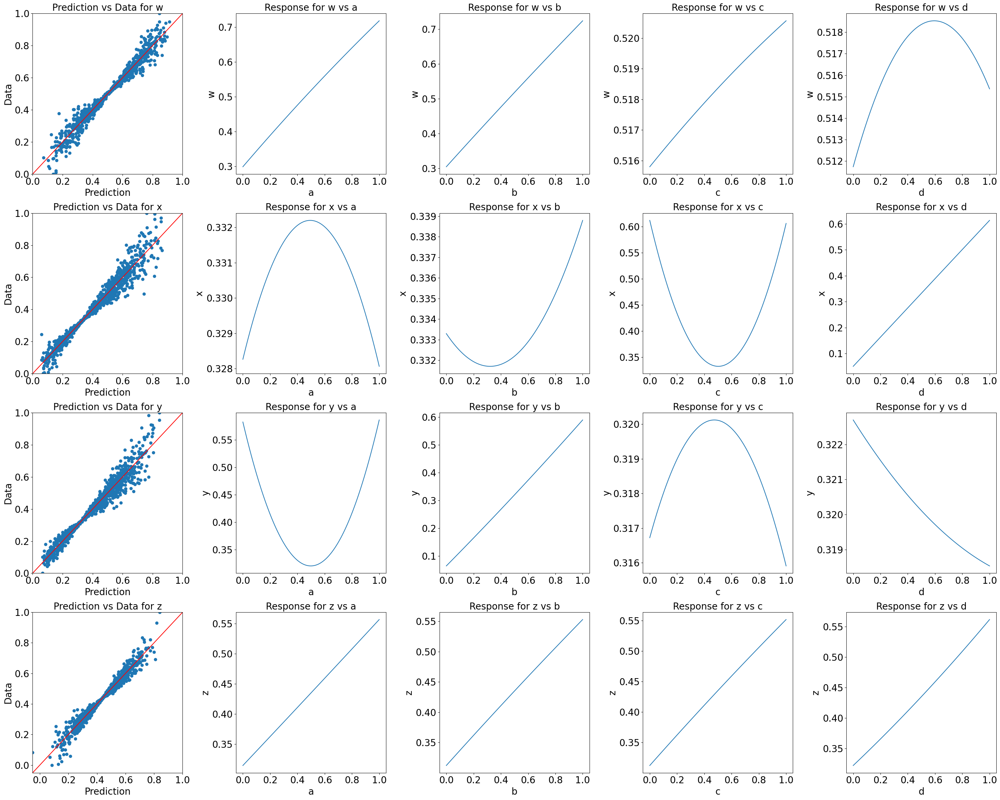

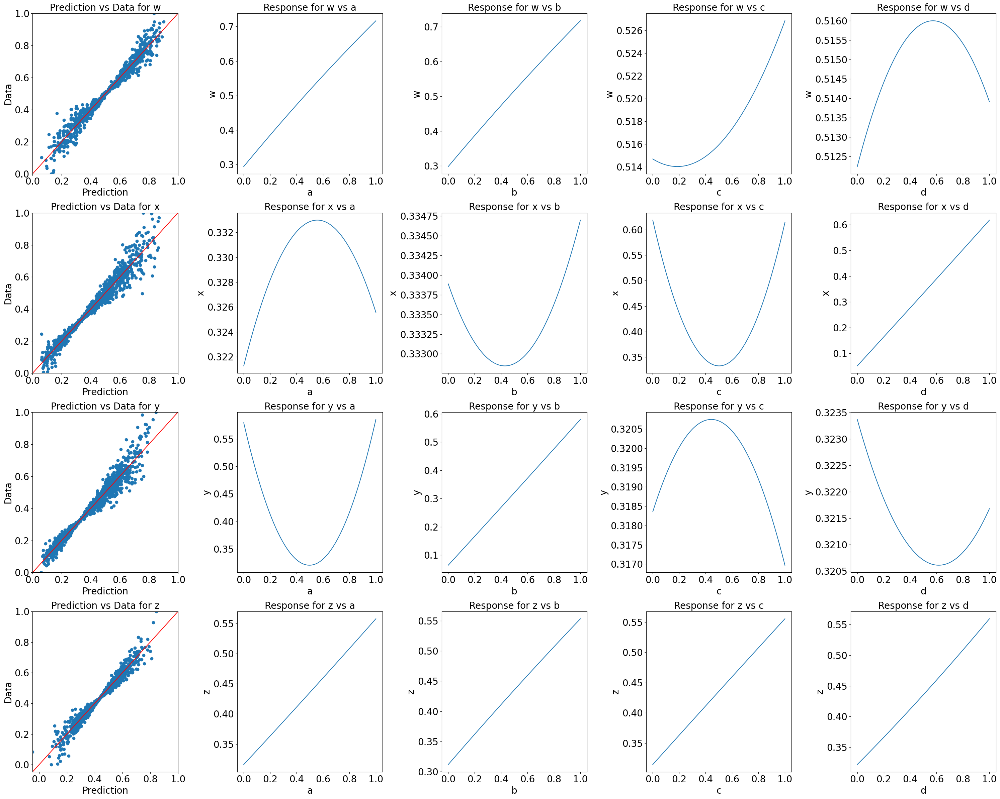

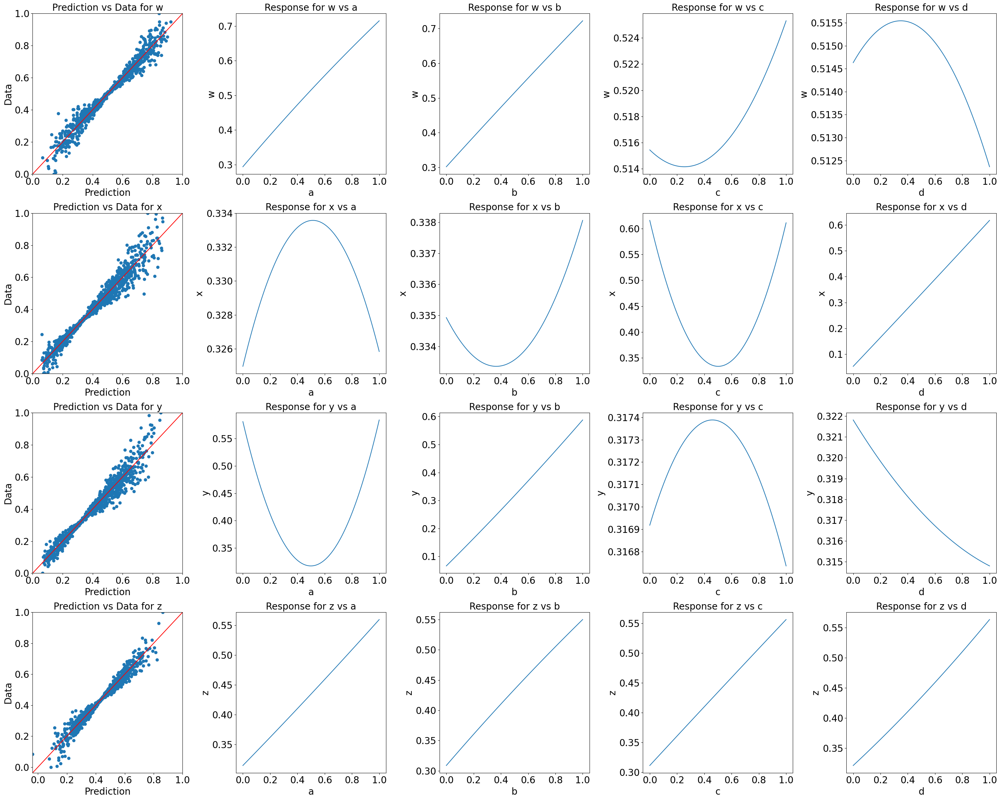

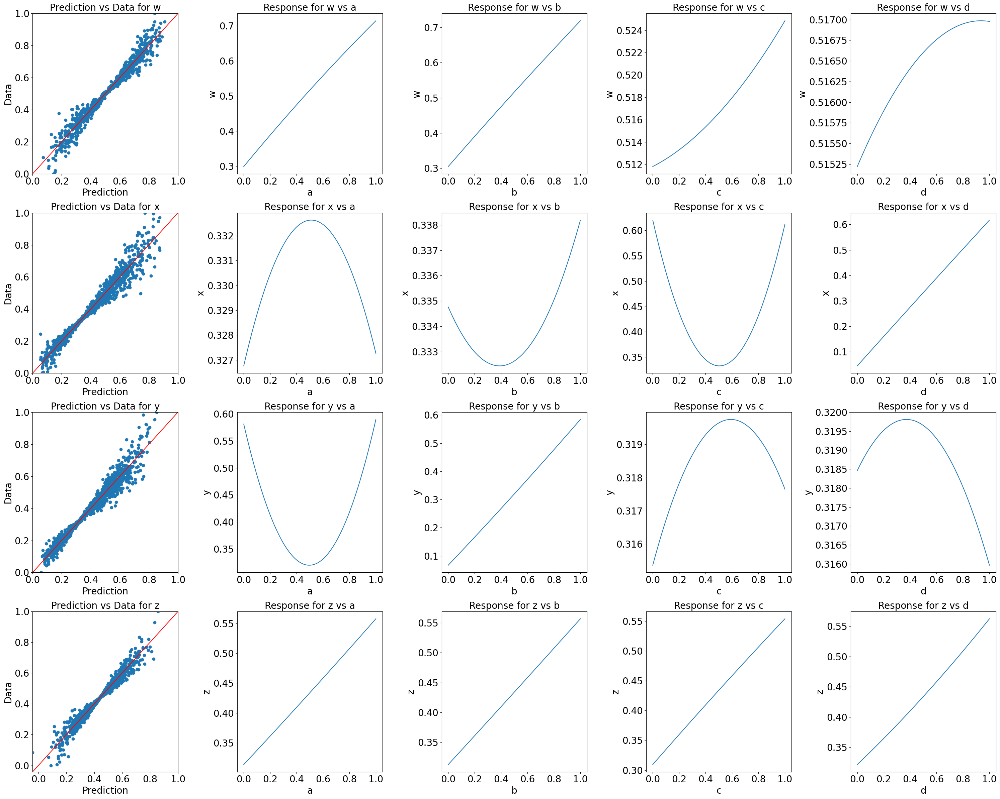

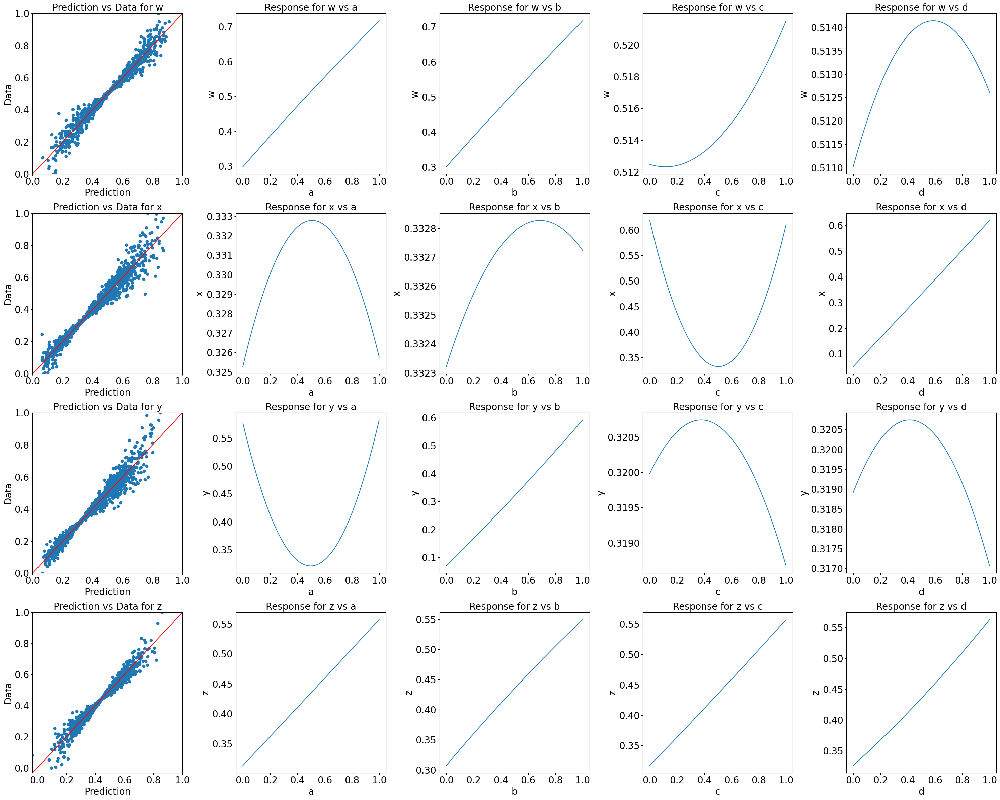

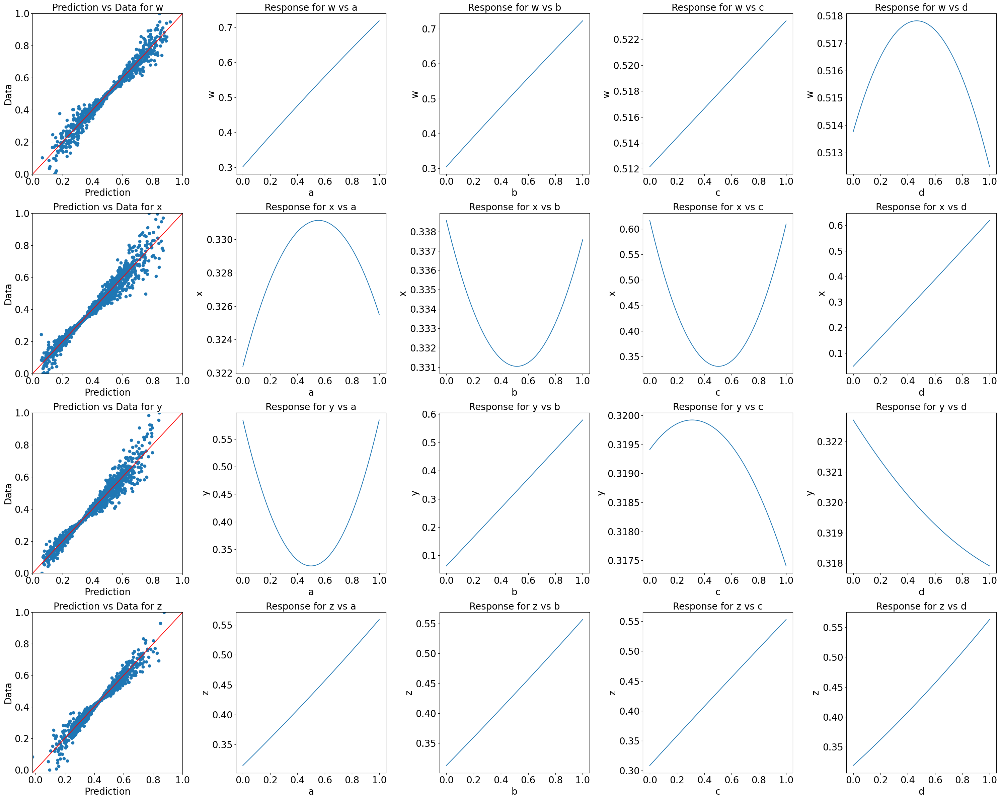

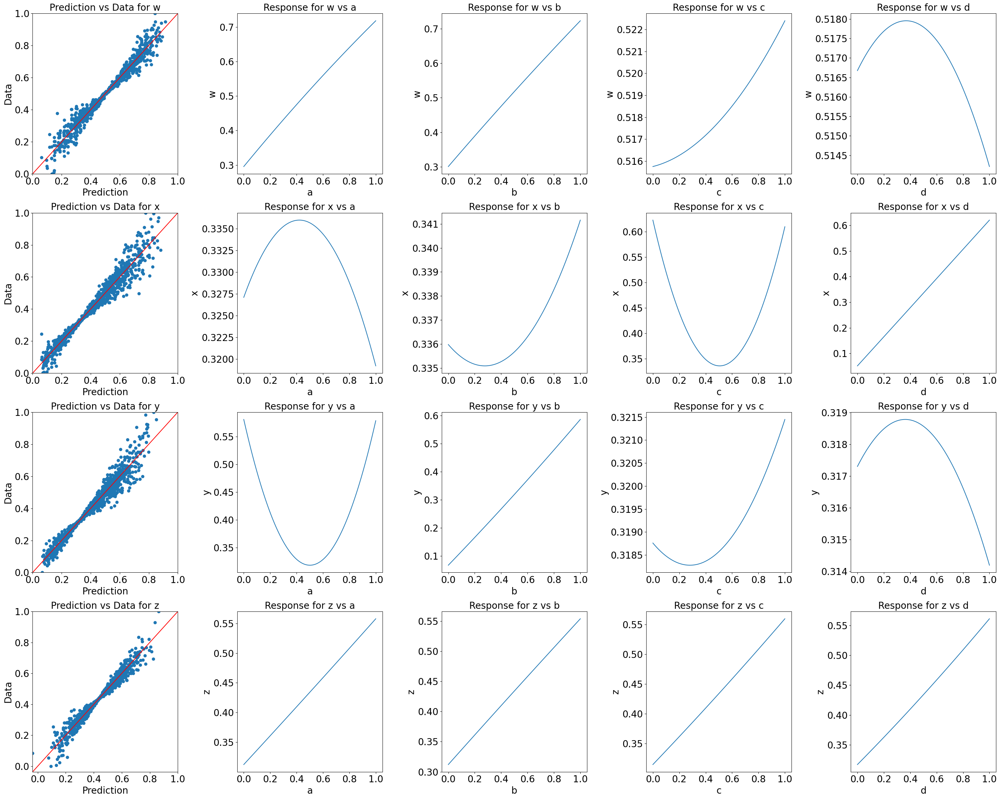

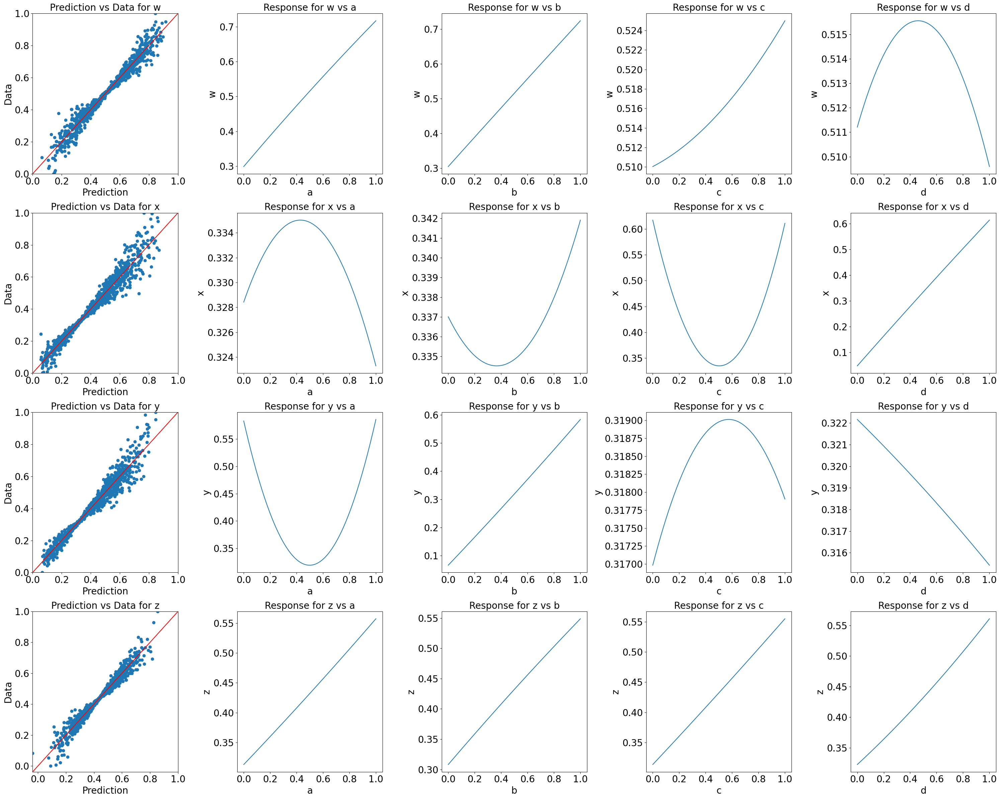

In [11]:
for idx, regressor in enumerate(ensemble.regressors):
    params = RegressorPlotParameters(regressor, app.factors.mean(), app.factors.min(), app.factors.max())
    reg_plot = RegressorPlot(params)
    reg_plot.plot_scaled()

In [12]:
#make predictions with all of the regressors on the full dataset

predictions = []
for regressor in ensemble.regressors:
    predictions.append(regressor.predict(app.factors))

In [13]:
mean_df = ensemble.predict(app.factors)
#std_df = pd.DataFrame(np.std(array_3d, axis=2), index=predictions[0].index, columns=predictions[0].columns)

In [14]:
#make a regressor against the full data
reg_data = PolynomialRegressionParameters(input_data = app.factors,
                                          output_data = app.responses,
                                          order = 2
                                          )

mlp_regressor_full = PolynomialRegressor(reg_data)
mlp_regressor_full.fit()

In [15]:
print(f"Error: {mlp_regressor_full.error_metrics()['nrmse']}")

Error: 0.036249751184068785


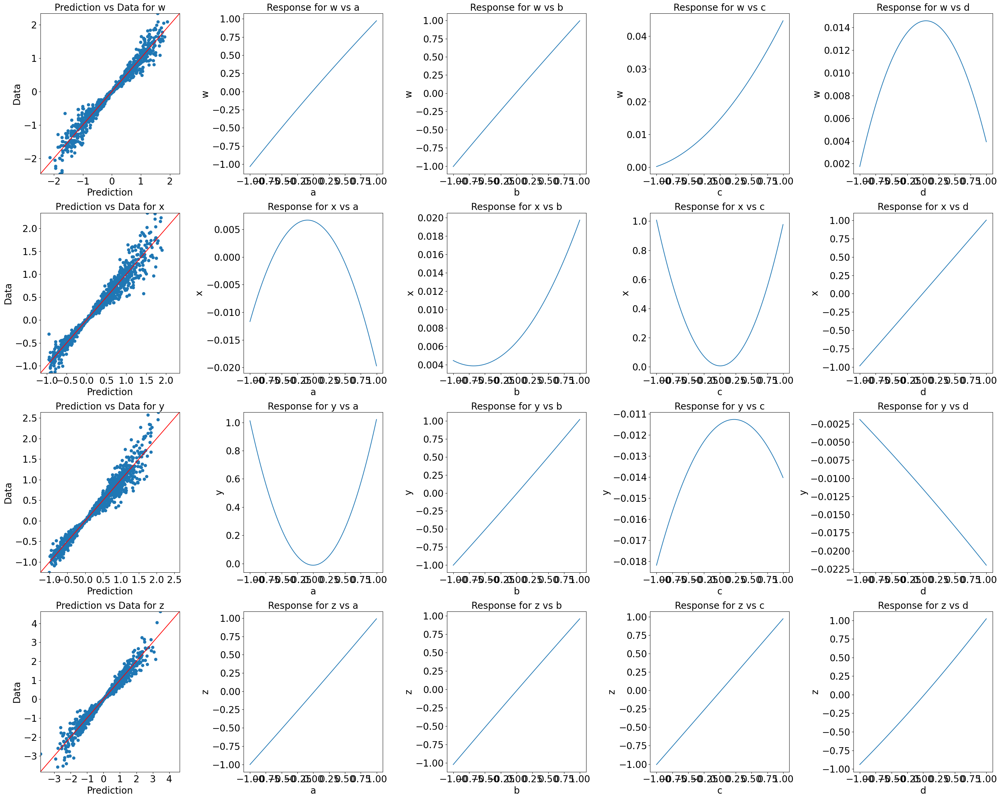

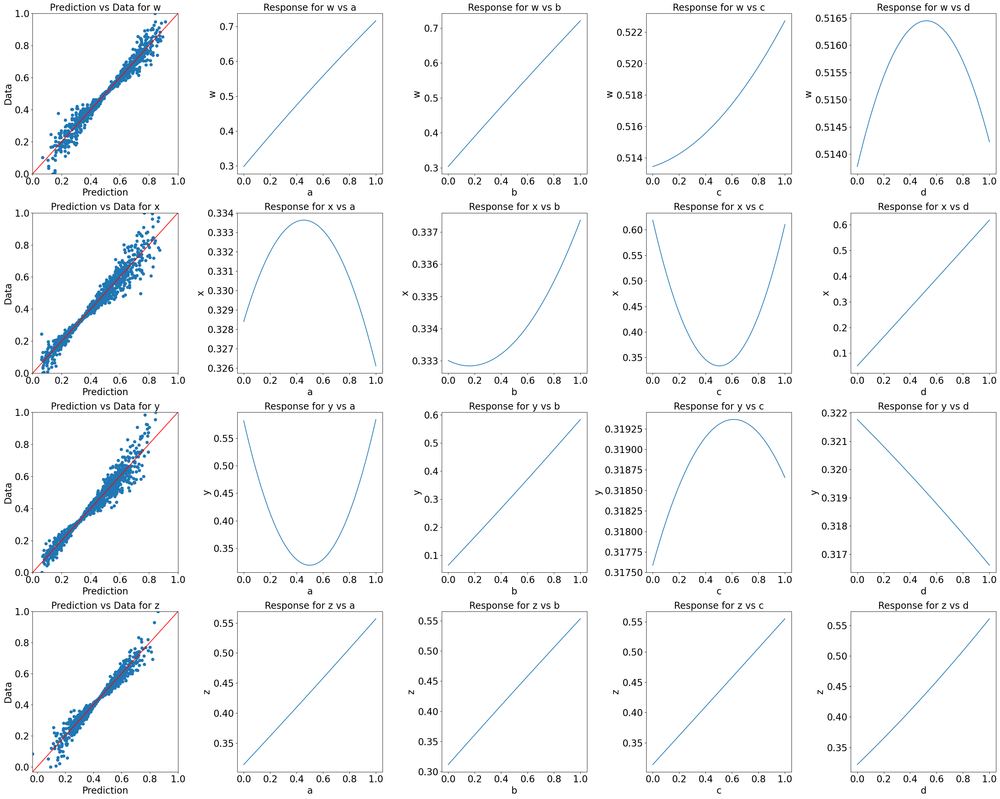

In [16]:
params_full = RegressorPlotParameters(mlp_regressor_full, app.factors.mean(), app.factors.min(), app.factors.max())
reg_plot_full = RegressorPlot(params_full)
reg_plot_full.plot()
reg_plot_full.plot_scaled()

In [17]:
predictions_full = mlp_regressor_full.predict(app.factors)

In [18]:
errors = {}

for idx, regressor in enumerate(ensemble.regressors):
    errors[idx] = regressor.error_metrics(multioutput="raw_values")['nrmse']

errors['mean'] = ensemble.error_metrics(multioutput="raw_values")['nrmse']
errors['full'] = mlp_regressor_full.error_metrics(multioutput="raw_values")['nrmse']

error_df = pd.DataFrame(errors).T
error_df.columns = app.responses.columns

In [19]:
pd.DataFrame(errors).T

,0,1,2,3
0,0.034830,0.041536,0.039313,0.028381
1,0.034798,0.041428,0.039426,0.028442
2,0.034829,0.041438,0.039384,0.028529
3,0.034949,0.041508,0.039392,0.028448
4,0.034850,0.041433,0.039280,0.028449
5,0.034818,0.041394,0.039443,0.028448
6,0.034816,0.041387,0.039405,0.028476
7,0.034823,0.041530,0.039283,0.028561
8,0.034858,0.041458,0.039334,0.028472
9,0.034841,0.041421,0.039234,0.028419


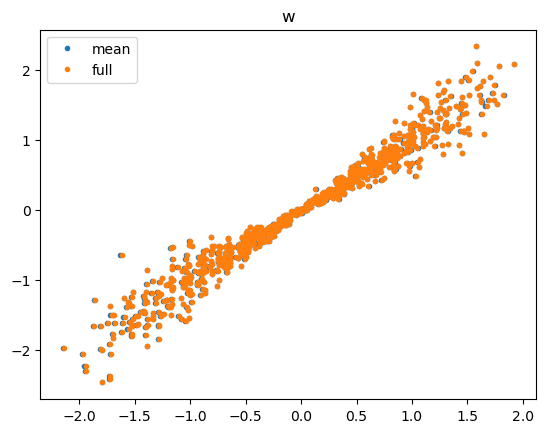

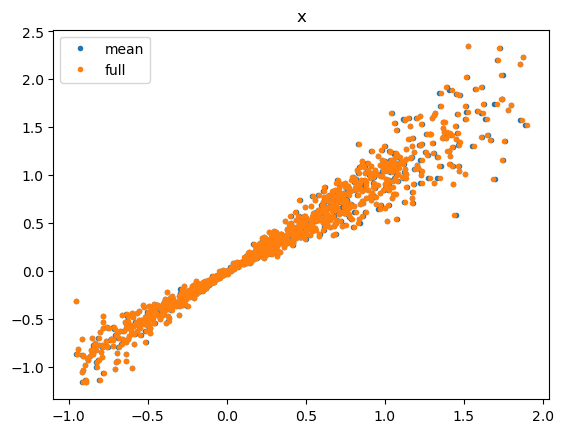

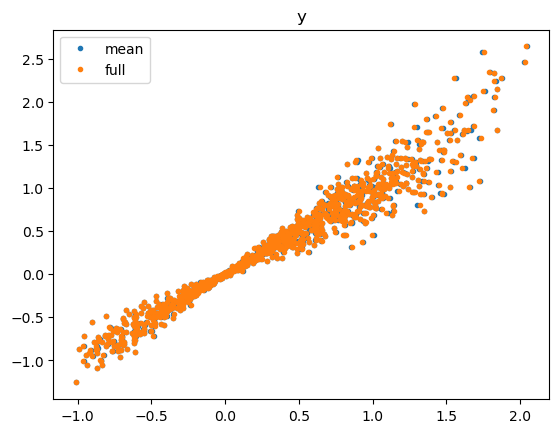

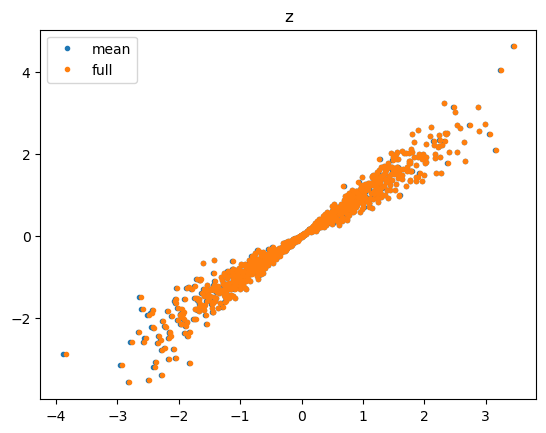

In [20]:
for column in mean_df.columns:
    plt.figure()
    plt.title(column)
    plt.plot(mean_df[column], app.responses[column], '.', label="mean")
    plt.plot(predictions_full[column], app.responses[column], '.', label="full")
    #for idx,prediction in enumerate(predictions):
    #    plt.plot(np.log(prediction[column]), np.log(app.responses[column]), '.', label=idx)
    plt.legend()

# Lets autotune the regressor

In [21]:
ensemble.get_tuned_parameters()

{'order': 2,
 'terms': ['1',
  'a',
  'b',
  'c',
  'd',
  'a^2',
  'a b',
  'a c',
  'a d',
  'b^2',
  'b c',
  'b d',
  'c^2',
  'c d',
  'd^2']}

In [24]:
ensemble.auto_tune(max_order=2)

In [25]:
ensemble.get_tuned_parameters()

{'order': 2, 'terms': ['a', 'b', 'c', 'd', 'a^2', 'c^2']}

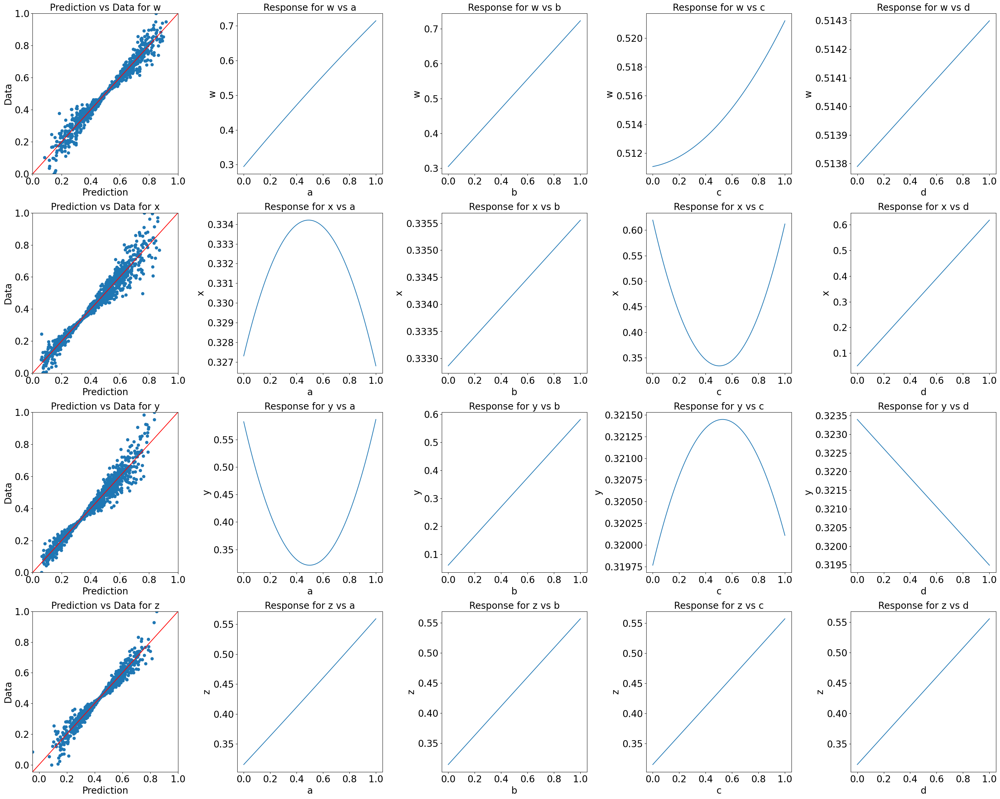

In [27]:
params_full = RegressorPlotParameters(ensemble, app.factors.mean(), app.factors.min(), app.factors.max())
reg_plot_full = RegressorPlot(params_full)
reg_plot_full.plot_scaled()